## Import Utils and MatPlotLib Params

In [1]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import matplotlib.colors as clrs
import pandas as pd
from sklearn.mixture import GaussianMixture
import shutil
from astropy.visualization import ZScaleInterval
import warnings

warnings.filterwarnings("ignore")

mlp_params = {
    "figure.figsize": [9, 6],
    "axes.labelsize": 22,
    "axes.titlesize": 24,
    "axes.titlepad": 15,
    "figure.titlesize": 24,
    "axes.labelpad": 10,
    "font.size": 16,
    "legend.fontsize": 18,
    "xtick.labelsize": 16,
    "ytick.labelsize": 16,
    "text.usetex": True if shutil.which("latex") else False,
    "font.family": "serif",
    "xtick.minor.visible": True,
    "ytick.minor.visible": True,
    "xtick.top": True,
    "ytick.left": True,
    "ytick.right": True,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "xtick.minor.size": 2.5,
    "xtick.major.size": 5,
    "ytick.minor.size": 2.5,
    "ytick.major.size": 5,
    "axes.axisbelow": True,
    "figure.dpi": 200,
}
plt.rcParams.update(mlp_params)

## Set the Al/Si and FeL/Si TIFF file paths

Set the Al/Si and Mg/Si TIFF file paths. `base_image` is the base lunar map. `file_path_al` and `file_path_fel` are the TIFF filepahs generated in the appropriate `resultsdir` by the mapping code.

In [2]:
file_path_al = (
    "Al_Si_combined.tiff"
)
file_path_fel = (
    "FeL_Si_combined.tiff"
)

base_image = "lroc_color_poles_4k.tif"
with rasterio.open(base_image) as src:
    base_data = np.stack([src.read(i + 1) for i in range(3)], axis=-1)

with rasterio.open(file_path_al) as src:
    data_al = src.read(1)  # Read the first band
    err_al = src.read(2)
    transform = src.transform
    nodata_val = 9999  # Use file's nodata value or default to 9999
data_al = np.copy(data_al)
err_al = np.copy(err_al)
data_al = np.ma.masked_equal(data_al, nodata_val)
err_al = np.ma.masked_equal(err_al, nodata_val)
data_al_flat = data_al.flatten()
data_err_al = err_al.filled(9999.0)


with rasterio.open(file_path_fel) as src:
    data_fel = src.read(1)  # Read the first band
    err_fel = src.read(2)
    transform = src.transform
    nodata_val = 9999  # Use file's nodata value or default to 9999
data_fel = np.copy(data_fel)
err_fel = np.copy(err_fel)
data_fel = np.ma.masked_equal(data_fel, nodata_val)
err_fel = np.ma.masked_equal(err_fel, nodata_val)
data_err_fel = err_fel.filled(9999.0)
data_fel_flat = data_fel.flatten()

# set lat-lon grid
n_lat, n_lon = data_al.shape
lons = np.linspace(-180, 180, n_lon)  # Longitude from -180 to 180
lats = np.linspace(90, -90, n_lat)  # Latitude from 90 to -90 (inverted)
lons_grid, lats_grid = np.meshgrid(lons, lats)
lat_flat = lats_grid.flatten()
lon_flat = lons_grid.flatten()

df = pd.DataFrame(
    {
        "latitude": lat_flat,
        "longitude": lon_flat,
        "Al_ratio": data_al_flat,
        "FeL_ratio": data_fel_flat,
    }
)

df_filtered = df[df["FeL_ratio"] != 9999.0]
df_filtered = df_filtered[abs(df_filtered["latitude"]) < 60]
df_filtered = df_filtered[df_filtered["Al_ratio"] != 9999.0]
df_filtered.dropna(inplace=True)

## Histogram for Al/Si

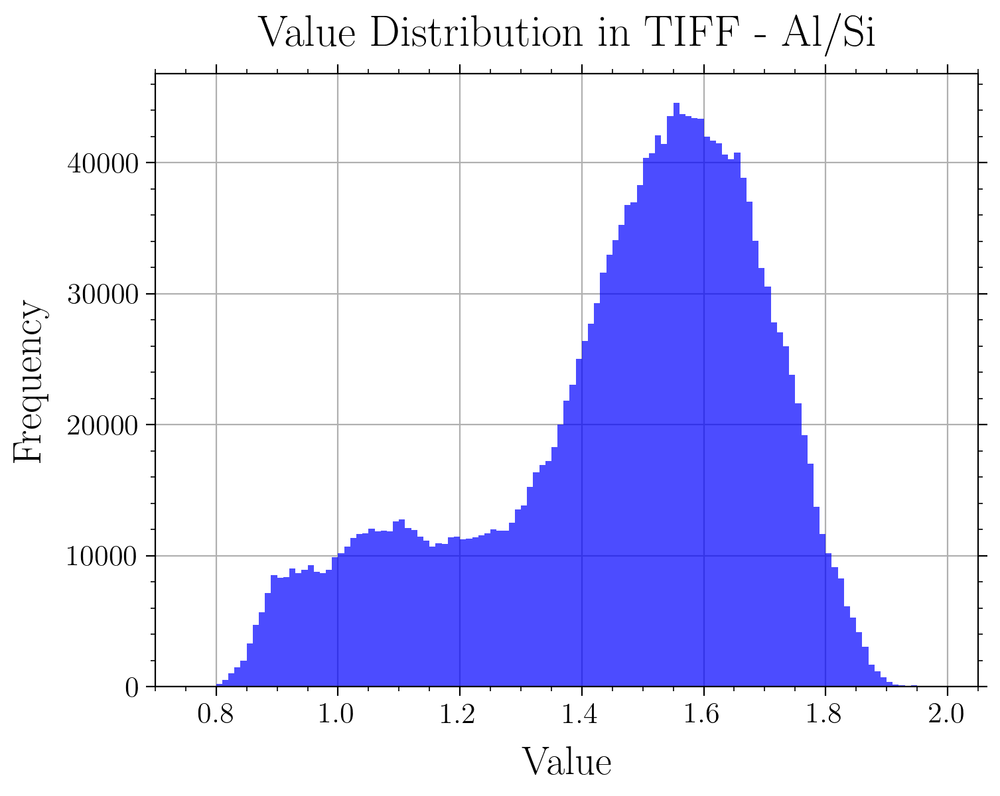

In [3]:
plt.figure(figsize=(8, 6))
plt.hist(data_al.flatten(), bins=200, color="blue", alpha=0.7, range=(0, 2))
plt.title("Value Distribution in TIFF - Al/Si")
plt.xlim(0.7, 2.05)
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.grid()
plt.show()

## Histogram for FeL/Si

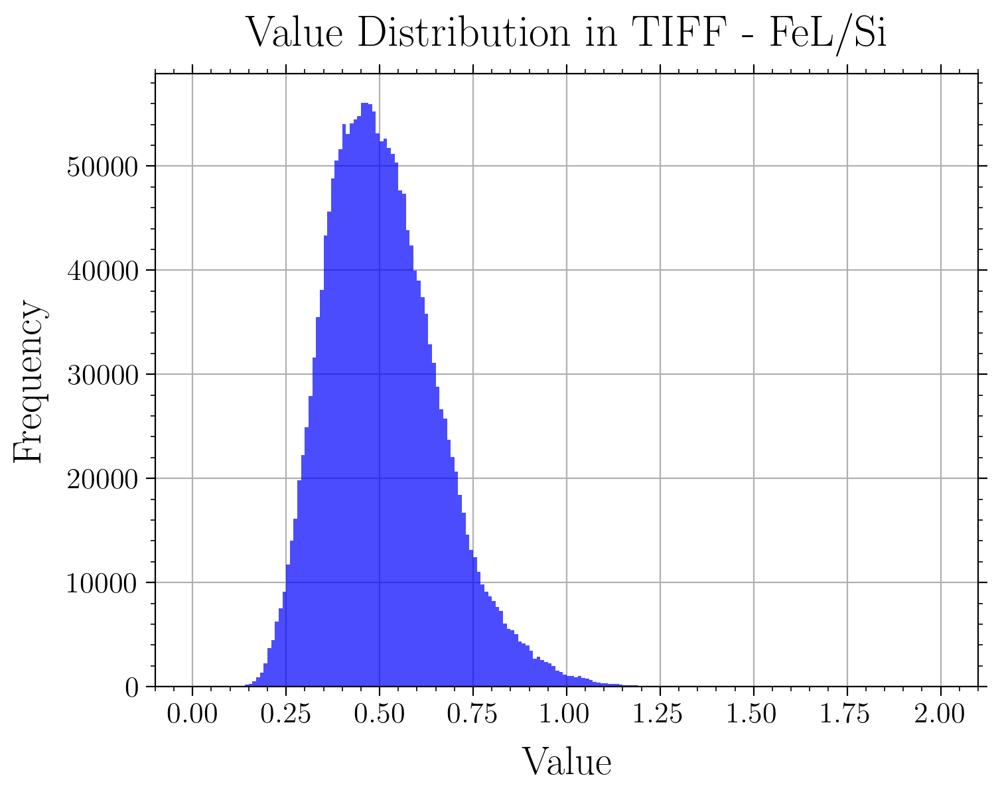

In [4]:
plt.figure(figsize=(8, 6))
plt.hist(data_fel.flatten(), bins=200, color="blue", alpha=0.7, range=(0, 2))
plt.title("Value Distribution in TIFF - FeL/Si")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.grid()
plt.show()

## Al/Si Ratio Heatmap

The block below plots the TIFF file onto the lunar surface as a heatmap. We observe and visually extract marial VS highland terrain separation based on the Al/Si ratio. In subsequent sections, we will do further clustering using other elemental ratios in order to sharply extract geographical features and possibly obtain further classification within the maria and the highlands.

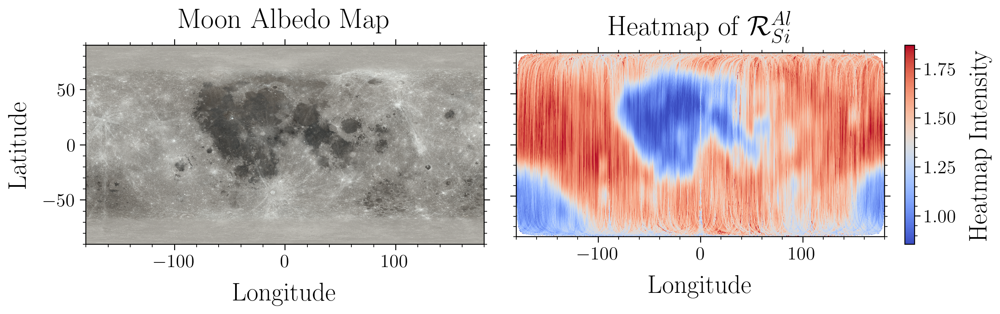

In [5]:
zmin, zmax = ZScaleInterval().get_limits(data_al[~data_al.mask])

fig, axs = plt.subplots(1, 2, figsize=(12, 6), sharey=True)
plt.subplot(1, 2, 1)
plt.imshow(
    base_data,
    extent=(-180, 180, -90, 90),
    interpolation="nearest",
    alpha=1,  # Full opacity for the base layer
)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Moon Albedo Map")
plt.subplot(1, 2, 2)
plt.imshow(
    data_al,
    extent=(-180, 180, -90, 90),
    cmap="coolwarm",  # Ensure the same extent as the base layer
    interpolation="nearest",
    alpha=1,  # Adjust opacity for overlay
    vmin=zmin,
    vmax=zmax,
)

plt.colorbar(label="Heatmap Intensity", fraction=0.025, pad=0.05)
plt.title(r"Heatmap of $\mathcal{R}^{Al}_{Si}$")
plt.xlabel("Longitude")
plt.tight_layout()
plt.show()

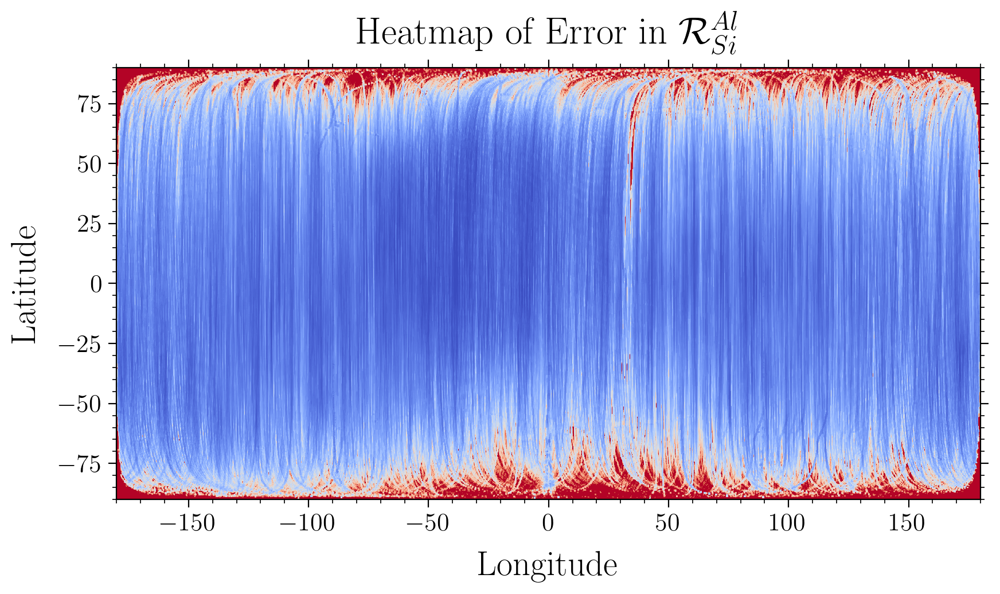

In [6]:
zmin, zmax = ZScaleInterval().get_limits(data_err_al)
plt.imshow(
    data_err_al,
    extent=(-180, 180, -90, 90),
    interpolation="nearest",
    alpha=1,  # Full opacity for the base layer
    cmap="coolwarm",
    vmin=zmin,
    vmax=zmax,
)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title(r"Heatmap of Error in $\mathcal{R}^{Al}_{Si}$")
plt.tight_layout()
plt.show()

## FeL/Si Ratio Heatmap

The block below plots the FeL/Si TIFF file onto the lunar surface as a heatmap. In subsequent sections, we will do further clustering using other elemental ratios in order to sharply extract geographical features and possibly obtain further classification within the maria and the highlands.

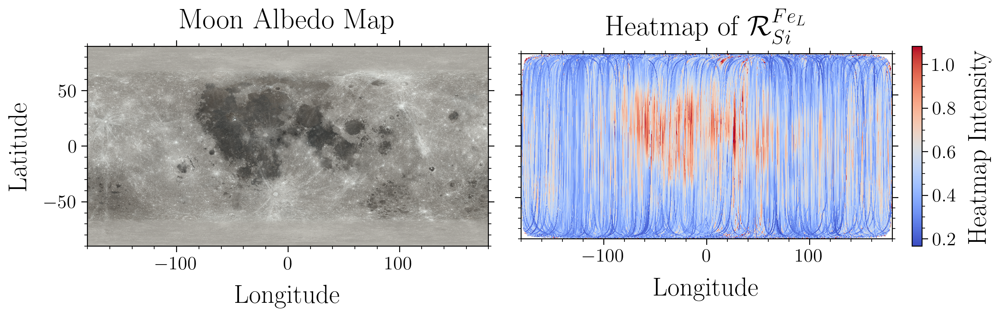

In [7]:
zmin, zmax = ZScaleInterval().get_limits(data_fel[~data_fel.mask])

fig, axs = plt.subplots(1, 2, figsize=(12, 6), sharey=True)
plt.subplot(1, 2, 1)
plt.imshow(
    base_data,
    extent=(-180, 180, -90, 90),
    interpolation="nearest",
    alpha=1,  # Full opacity for the base layer
)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Moon Albedo Map")
plt.subplot(1, 2, 2)
plt.imshow(
    data_fel,
    extent=(-180, 180, -90, 90),
    cmap="coolwarm",  # Ensure the same extent as the base layer
    interpolation="nearest",
    alpha=1,  # Adjust opacity for overlay
    vmin=zmin,
    vmax=zmax,
)

plt.colorbar(label="Heatmap Intensity", fraction=0.025, pad=0.05)
plt.title(r"Heatmap of $\mathcal{R}^{Fe_L}_{Si}$")
plt.xlabel("Longitude")


plt.tight_layout()
plt.show()

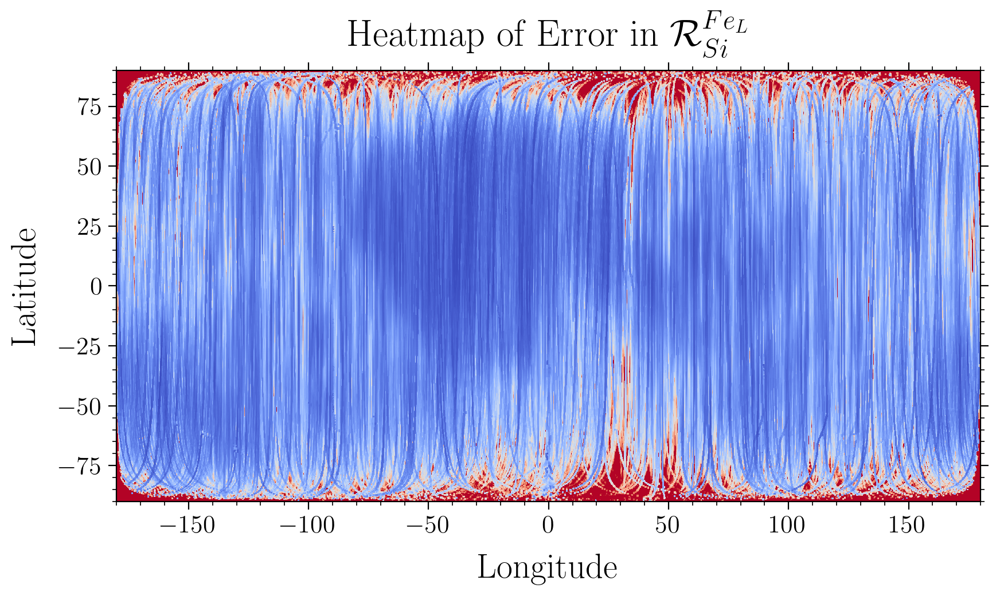

In [8]:
zmin, zmax = ZScaleInterval().get_limits(data_err_fel)
plt.imshow(
    data_err_fel,
    extent=(-180, 180, -90, 90),
    interpolation="nearest",
    alpha=1,  # Full opacity for the base layer
    cmap="coolwarm",
    vmin=zmin,
    vmax=zmax,
)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title(r"Heatmap of Error in $\mathcal{R}^{Fe_L}_{Si}$")
plt.tight_layout()
plt.show()

# Al/Si Ratio Classification

We fit a double Gaussian to the Al histogram. The intersection point of the two Gaussians (close to the histogram's minimum) is used as a threshold value for Al ratio in subsequent analysis. Run the block below to fit the double Gaussian and obtain the intersection point and fit parameters.

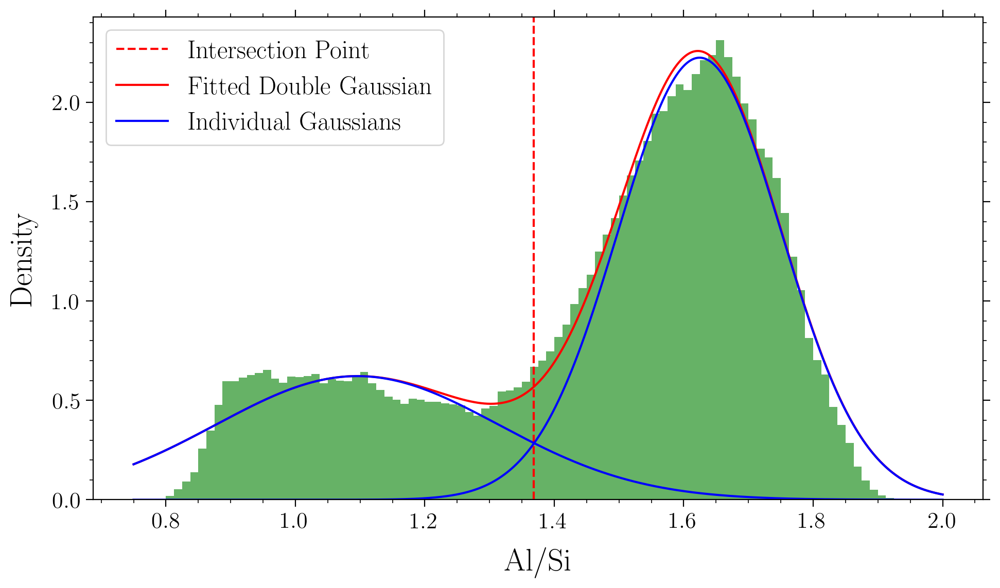

0.6222745895905324 1.095562517404181 0.21864951597161328 2.224821038647069 1.6245401999928981 0.12611482569044766
X-Intersection 1.3681181181181181


In [9]:
from scipy.optimize import curve_fit


def fit_gaussians(df):
    al_ratio = df["Al_ratio"].values

    hist, bin_edges = np.histogram(al_ratio, bins=100, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    def double_gaussian(x, amp1, mean1, stddev1, amp2, mean2, stddev2):
        return amp1 * np.exp(-((x - mean1) ** 2) / (2 * stddev1**2)) + amp2 * np.exp(
            -((x - mean2) ** 2) / (2 * stddev2**2)
        )

    def gaussian(x, amp, mean, stddev):
        return amp * np.exp(-((x - mean) ** 2) / (2 * stddev**2))

    # Fit a double Gaussian curve to the data
    popt, _ = curve_fit(
        double_gaussian, bin_centers, hist, p0=[0.5, 1, 0.15, 2, 1.6, 0.15]
    )

    # Calculate the fitted double Gaussian curve
    x = np.linspace(0.75, 2, 1000)
    fitted_double_curve = double_gaussian(x, *popt)
    fitted_curve1 = gaussian(x, *popt[:3])
    fitted_curve2 = gaussian(x, *popt[3:])

    # Find the intersection of the two Gaussians
    def find_intersection(x, y1, y2):
        idx = np.argwhere(np.diff(np.sign(y1 - y2)) != 0).reshape(-1) + 0
        return x[idx], y1[idx]

    x_intersect, y_intersect = find_intersection(x, fitted_curve1, fitted_curve2)
    x_intersect = x_intersect[0]

    # Plot the intersection point
    # Plot the histogram of al_ratio with the fitted double Gaussian curve
    plt.figure(figsize=(10, 6))
    plt.hist(al_ratio, bins=100, density=True, alpha=0.6, color="g", range=(0.75, 2))
    plt.axvline(x_intersect, linestyle="--", color="r", label="Intersection Point")
    plt.plot(x, fitted_double_curve, "-r", label="Fitted Double Gaussian")
    plt.plot(x, fitted_curve1, "-b", label="Individual Gaussians")
    plt.plot(x, fitted_curve2, "-b")

    plt.xlabel("Al/Si")
    plt.ylabel("Density")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Calculate the Mahalanobis distance for al_ratio
    print(*popt)
    print("X-Intersection", x_intersect)
    return x_intersect, popt


al_intersect, popt = fit_gaussians(df_filtered)
al_peak_1_sigma = popt[2]
al_peak_1 = popt[1]

# Al/Si and FeL/Si Compositional Clusters

In this section, we make a scatter plot of FeL/Si vs Al/Si ratio for various points of the lunar surface. Since the maps contain $\approx 8,000,000$ points, we sample some $50,000-100,000$ points uniformly at randomly. The plot is made with density, yellow respresenting high density of points. Set the `sample_size` parameter to change the number of sampled points.

It is clearly observed that the Al threshold separates two clusters, with the high Al cluster having a much larger density.

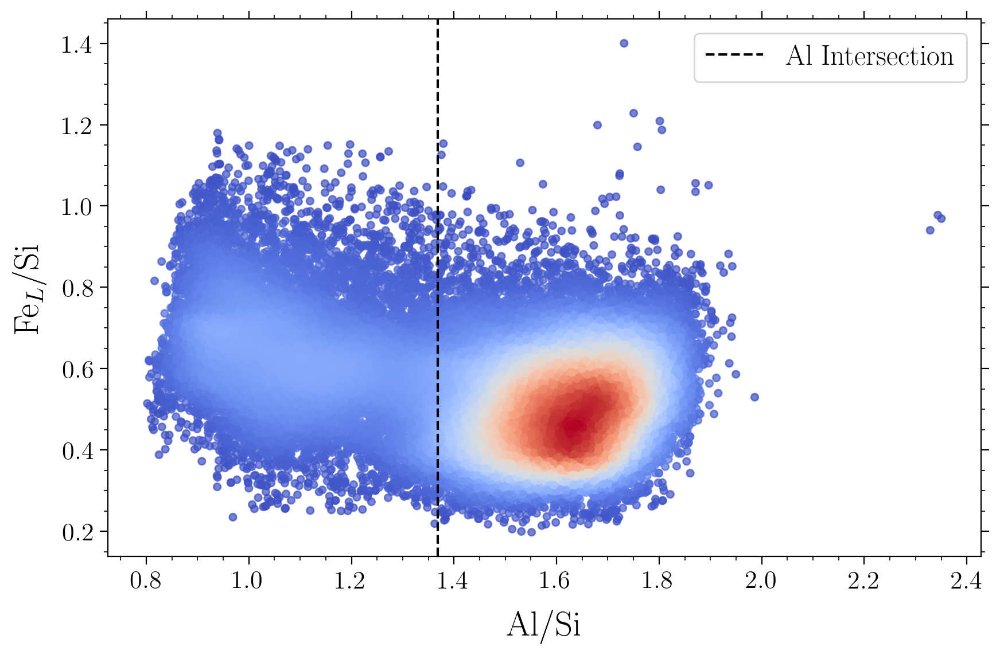

In [10]:
from scipy.stats import gaussian_kde

sample_size = 40000


def density_scatter_ratios(df):

    fel_ratio = df["FeL_ratio"].values
    al_ratio = df["Al_ratio"].values

    fel_ratio = fel_ratio[~np.isnan(fel_ratio)]
    kde = gaussian_kde([al_ratio, fel_ratio])([al_ratio, fel_ratio])
    plt.xlabel("Al/Si")
    plt.ylabel(r"Fe$_L$/Si")
    plt.scatter(al_ratio, fel_ratio, c=kde, s=20, alpha=0.7, cmap="coolwarm")
    plt.axvline(x=al_intersect, color="black", linestyle="--", label="Al Intersection")
    plt.legend()
    plt.tight_layout()
    plt.show()


sampled_df = df_filtered.sample(n=sample_size)
density_scatter_ratios(sampled_df)

## Triple Gaussian Mixture Model

In this block, we separate the high Al/Si points, and apply a 2D-Gaussian mixture with 3 peaks to fit the density plot. A plot of the gaussian density contours is made by running the block. Further, the GMM classification boundary is used to separate the three clusters, plotted based on probability values. The intermediate (green) cluster is able to demarcate the _Mare Australe_ from the blue (high-Al highland) cluster, and forms a border marial region. The high-Fe low-Al (orange) forms a continuous marial component. Combined with the Mg based classifiers, we can form a broad classification of all geographical regions and extract all major features. Also see the Mg number which takes the Fe content into account.

Set the `cluster_colors` array with 3 colors for the 3 clusters.

From the plot we see a negative correlation between Fe and Al


-0.3471770187264393
R^2 0.12


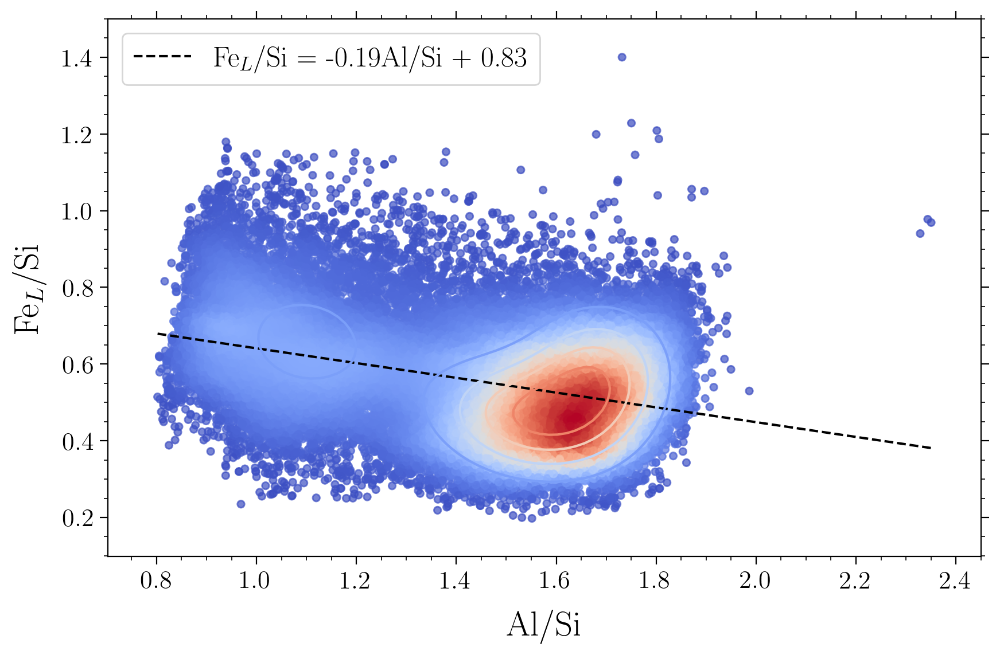

ValueError: RGBA values should be within 0-1 range

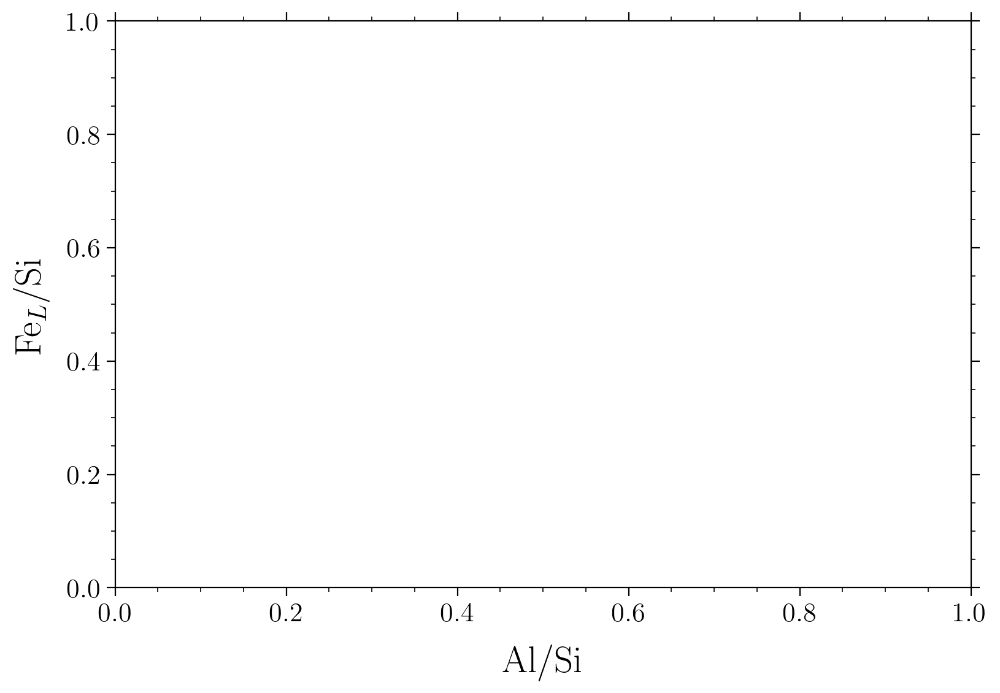

In [11]:

cluster_colors = [f"C{i}" for i in range(3)]
cluster_colors_rgb = np.array([clrs.to_rgb(clr) for clr in cluster_colors])


def linear(x, m, c):
    return m * x + c


def gaussian_cluster(df, n_components_, cluster_colors_):
    al_ratio = df["Al_ratio"].values
    fel_ratio = df["FeL_ratio"].values

    stack = np.vstack([al_ratio, fel_ratio]).T
    kde = gaussian_kde(stack.T)(stack.T)
    gmm = GaussianMixture(n_components=n_components_)
    gmm.fit(stack)
    labels = gmm.predict(stack)
    probabilities = np.sum(
        gmm.predict_proba(stack)[:, :, np.newaxis] * cluster_colors_, axis=1
    )

    # Create a grid for visualization
    x_grid = np.linspace(min(al_ratio) - 0.1, max(al_ratio) + 0.1, 100)
    y_grid = np.linspace(min(fel_ratio) - 0.1, max(fel_ratio) + 0.1, 100)
    X, Y = np.meshgrid(x_grid, y_grid)
    grid_points = np.vstack([X.ravel(), Y.ravel()]).T

    # Calculate the density (probabilities) for each point in the grid
    log_density = gmm.score_samples(grid_points)
    density = np.exp(log_density).reshape(X.shape)
    # print(gmm.score_samples(stack).sum())
    # Plot the scatter points for the "red" points
    plt.xlabel("Al/Si")
    plt.ylabel(r"Fe$_L$/Si")
    plt.scatter(al_ratio, fel_ratio, c=kde, s=20, alpha=0.7, cmap="coolwarm")
    x = np.linspace(min(al_ratio), max(al_ratio), 100)

    popt, _ = curve_fit(linear, al_ratio, fel_ratio)
    corrcoef = np.corrcoef(al_ratio, fel_ratio)[0, 1]
    print(corrcoef)
        
    m, c = popt
    R_squared = 1 - np.sum((fel_ratio - linear(al_ratio, *popt)) ** 2) / np.sum(
        (fel_ratio - np.mean(fel_ratio)) ** 2
    )
    print(f"R^2 {R_squared:.2f}")
    plt.plot(
        x,
        linear(x, *popt),
        color="black",
        linestyle="--",
        label=rf"Fe$_L$/Si = {m:.2f}Al/Si + {c:.2f}",
    )
    # Plot the GMM density as contours
    plt.contour(X, Y, density, levels=5, cmap="coolwarm")
    plt.legend()
    plt.tight_layout()
    plt.show()
    # Plot the contour line which divides the plane into two based on the clusters
    # Predict the cluster for each point in the grid
    # Plot the scatter points for the "red" points with predicted cluster colors
    plt.xlabel("Al/Si")
    plt.ylabel(r"Fe$_L$/Si")
    plt.scatter(
        al_ratio,
        fel_ratio,
        c=probabilities,
        s=20,
        alpha=0.7,
    )
    plt.tight_layout()
    plt.show()

    # Create a scatter plot on top of the base_data
    plt.figure(figsize=(12, 8))
    plt.imshow(base_data, extent=(-180, 180, -90, 90), interpolation="nearest", alpha=1)
    plt.scatter(df["longitude"], df["latitude"], c=probabilities, s=10, alpha=0.07)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.show()
    plt.close()


gaussian_cluster(sampled_df, 3, cluster_colors_rgb)

## 5 component gaussian mixture

If we attempt to increase the number of gaussian clusters, the choice of cluster means is biased by the large weight of the high-Al highland cluster(s). This throws off the gaussian mixture model and causes it to fit two clusters in that region, which are not geographically significant. Thus, the Fe/Si ratio is ill-suited for highland classification, as opposed to the Mg/Si ratio. However, some amount of marial clustering is extracted, including a faint separation of the _Mare Serenitatis_ and _Mare Tranquilitatis_ from the _Mare Imbrium_.

-0.4509752886637658
R^2 0.20


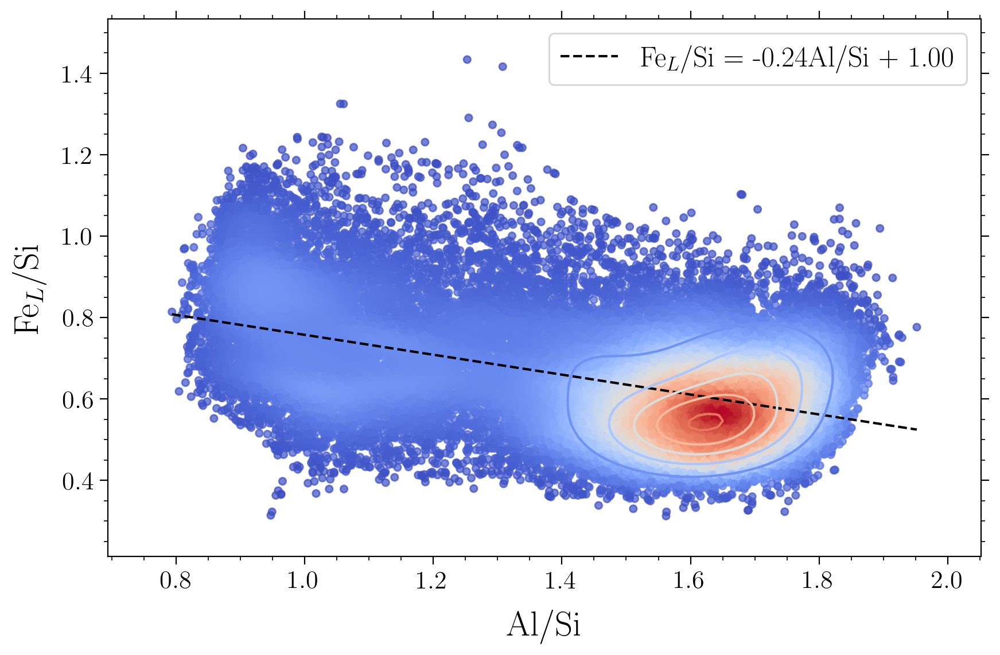

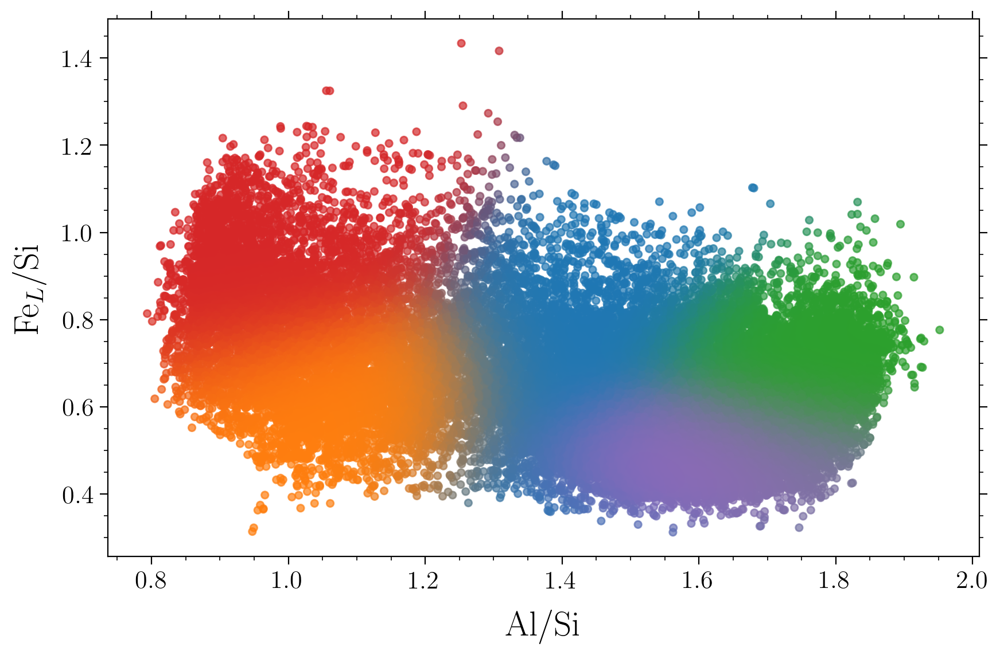

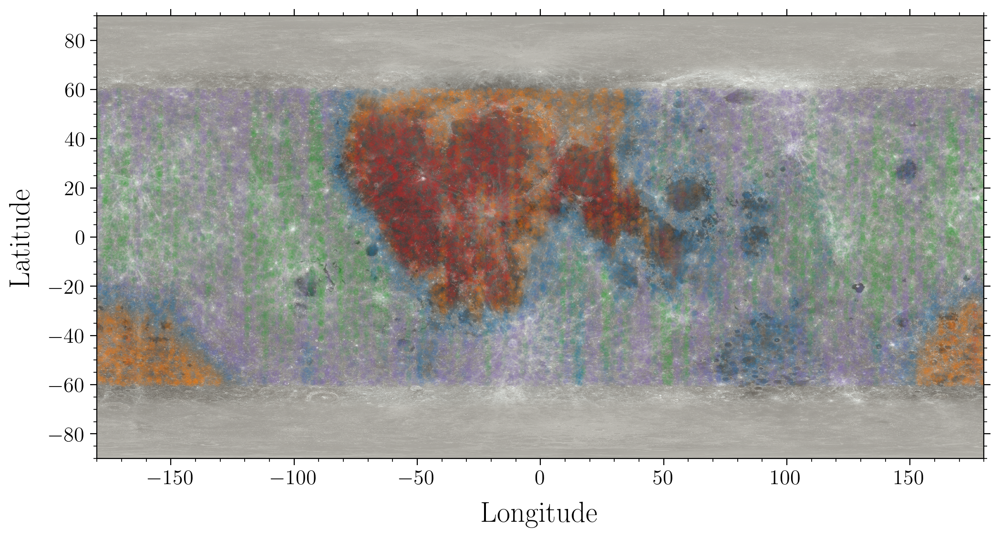

In [ ]:
cluster_colors = [f"C{i}" for i in range(5)]
cluster_colors_rgb = np.array([clrs.to_rgb(clr) for clr in cluster_colors])

gaussian_cluster(sampled_df, 5, cluster_colors_rgb)